<h1><center>Reducing Commercial Aviation Fatalities</center></h1>

## 1. Overview

Aviation fatalities are deaths caused due to aerospace vehicles during a flight operation or other operations involving that vehicle. Most of these fatalities are because of ineffective attention of the pilots who may be distracted, sleepy or in other dangerous cognitive states.

The physiological data is acquired from actual pilots in test situations who were subjected to various distractions. The pilots experienced distractions intended to induce one of the following three cognitive states:
1. Channelized Attention (CA): is the state of being focused on one task to the exclusion of all others. 
2. Diverted Attention (DA): is the state of having one’s attention diverted by actions or thought processes associated with a decision. 
3. Startle/Surprise (SS): is induced by having the subjects watch movie clips with jump scares.

We have to build a model to predict the different cognitive cases. The metric used to evaluate the model is multi class log loss.


## 2. Exploratory Data Analysis - Univariate Analysis
### 2.1 Load the data

In [ ]:
# import libraries
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import log_loss
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
import plotly.express as px
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import normalize
from sklearn.preprocessing import StandardScaler
import numpy as np
import warnings
warnings.filterwarnings("ignore")

In [ ]:
# load the train and test data to dataframes
train_df = pd.read_csv("..\\data\\train.csv")
test_df = pd.read_csv("..\\data\\test.csv")

### 2.2 Overview of the data

In [ ]:
print(f"Shape of train data: {train_df.shape}")
print(f"Shape of test data: {test_df.shape}")

Shape of train data: (4867421, 28)
Shape of test data: (17965143, 28)


In [ ]:
train_df.head(5)

,crew,experiment,time,seat,eeg_fp1,eeg_f7,eeg_f8,eeg_t4,eeg_t6,eeg_t5,...,eeg_c4,eeg_p4,eeg_poz,eeg_c3,eeg_cz,eeg_o2,ecg,r,gsr,event
0,1,CA,0.011719,1,-5.28545,26.775801,-9.527310,-12.793200,16.717800,33.737499,...,37.368999,17.437599,19.201900,20.5968,-3.95115,14.507600,-4520.0,817.705994,388.829987,A
1,1,CA,0.015625,1,-2.42842,28.430901,-9.323510,-3.757230,15.969300,30.443600,...,31.170799,19.399700,19.689501,21.3547,1.33212,17.750200,-4520.0,817.705994,388.829987,A
2,1,CA,0.019531,1,10.67150,30.420200,15.350700,24.724001,16.143101,32.142799,...,-12.012600,19.396299,23.171700,22.4076,1.53786,22.247000,-4520.0,817.705994,388.829987,A
3,1,CA,0.023438,1,11.45250,25.609800,2.433080,12.412500,20.533300,31.494101,...,18.574100,23.156401,22.641199,19.3367,2.54492,18.998600,-4520.0,817.705994,388.829987,A
4,1,CA,0.027344,1,7.28321,25.942600,0.113564,5.748000,19.833599,28.753599,...,6.555440,22.754700,22.670300,20.2932,1.69962,22.812799,-4520.0,817.705994,388.829987,A


In [ ]:
train_df.columns

Index(['crew', 'experiment', 'time', 'seat', 'eeg_fp1', 'eeg_f7', 'eeg_f8',
       'eeg_t4', 'eeg_t6', 'eeg_t5', 'eeg_t3', 'eeg_fp2', 'eeg_o1', 'eeg_p3',
       'eeg_pz', 'eeg_f3', 'eeg_fz', 'eeg_f4', 'eeg_c4', 'eeg_p4', 'eeg_poz',
       'eeg_c3', 'eeg_cz', 'eeg_o2', 'ecg', 'r', 'gsr', 'event'],
      dtype='object')

#### Meaning of the headers
1. crew: a unique id for a pair of pilots. There are 9 crews in the data.
2. experiment: The state that we are trying to replicate. One of CA, DA or SS in train data. LOFT in test data. 
3. time: seconds into the experiment.
4. seat: is the pilot in the left (0) or right (1) seat.
5. eeg: data with prefix eeg are electroencephalogram recordings.
6. ecg: 3-point Electrocardiogram signal. The sensor had a resolution/bit of .012215 µV and a range of -100mV to +100mV. The data are provided in microvolts.
7. r: Respiration, a measure of the rise and fall of the chest. The sensor had a resolution/bit of .2384186 µV and a range of -2.0V to +2.0V. The data are provided in microvolts.
8. gsr: Galvanic Skin Response, a measure of electrodermal activity. The sensor had a resolution/bit of .2384186 µV and a range of -2.0V to +2.0V. The data are provided in microvolts.
9. event: The state of the pilot at the given time: one of A = baseline, B = SS, C = CA, D = DA

### 2.3 Check for duplicate records and null values

In [ ]:
# duplicate values
print('-'*100)
if True in list(train_df.duplicated()):
    print("Duplicate records found in train data")
else:
    print("No duplicate records found in train data")
    
if True in list(test_df.duplicated()):
    print("Duplicate records found in test data")
else:
    print("No duplicate records found in test data")
    
# null values
print('-'*100)
if True in list(train_df.isnull()):
    print("Null values found in train data")
else:
    print("No Null values found in train data")
    
if True in list(test_df.isnull()):
    print("Null values found in test data")
else:
    print("No null values found in test data")
    
print('-'*100)

----------------------------------------------------------------------------------------------------
No duplicate records found in train data
No duplicate records found in test data
----------------------------------------------------------------------------------------------------
No Null values found in train data
No null values found in test data
----------------------------------------------------------------------------------------------------


### 2.4 Distribution of events

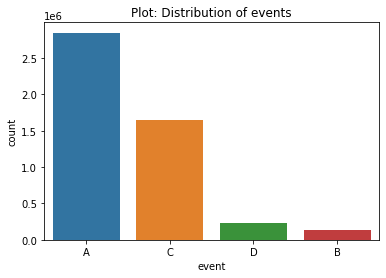

In [ ]:
# countplot to find the number of occurence of each event
sns.countplot(x ='event', data = train_df)
plt.title("Plot: Distribution of events")
plt.show()

#### Observation:
1. The data is highly imbalanced.
2. Event 'A' (baseline) and 'C' (CA) have occured the most.

### 2.5 Analysis of 'crew' feature

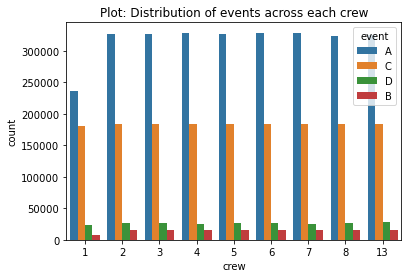

In [ ]:
# countplot to find the number of occurence of each event
sns.countplot(x ='crew', hue = 'event', data = train_df)
plt.title("Plot: Distribution of events across each crew")
plt.show()

#### Observation:
1. There are 9 different crews.
2. The distribution of occurence of events in each crew is similar.

### 2.6 Analysis of 'seat' feature

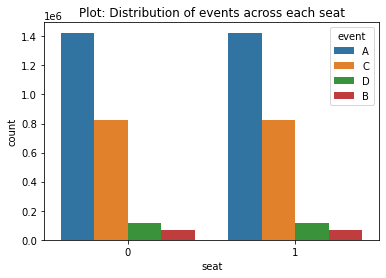

In [ ]:
# countplot to find the number of occurence of each event
sns.countplot(x ='seat', hue = 'event', data = train_df)
plt.title("Plot: Distribution of events across each seat")
plt.show()

#### Observation:
    The distribution of occurence of events in both the seats is similar.

### 2.7 Analysis of 'time' feature

In [ ]:
# summary of time feature
train_df['time'].describe()

count    4.867421e+06
mean     1.782358e+02
std      1.039592e+02
min      3.000000e-03
25%      8.808100e+01
50%      1.769297e+02
75%      2.683398e+02
max      3.603711e+02
Name: time, dtype: float64

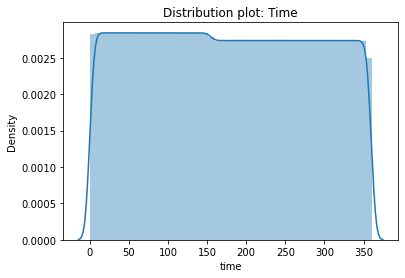

In [ ]:
# distribution plot
sns.distplot(train_df['time'])
plt.title("Distribution plot: Time")
plt.show()

#### Observation
1. The minimum time for an event to be recorded was 0.003 seconds.
2. The maximum time for an event to be recorded was 360 seconds.
3. The average is 178 seconds.

Now, let's check the it with respect to each event

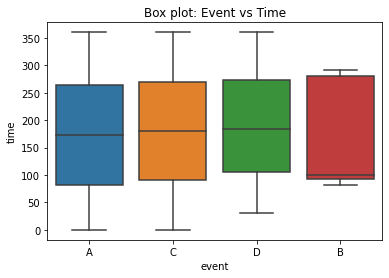

In [ ]:
sns.boxplot(x = 'event', y = 'time', data = train_df)
plt.title("Box plot: Event vs Time")
plt.show()

#### Observation:
1. For events A, C and D, 50% of times, the event occured in between 160-180 seconds.
2. For event B, 50% of times, the event occured at around 100 seconds

### 2.8 Analysis of 'ecg' feature

In [ ]:
# summary of ecg feature
train_df['ecg'].describe()

count    4.867421e+06
mean     5.285460e+03
std      1.214126e+04
min     -1.858570e+04
25%     -2.550070e+03
50%      5.920510e+03
75%      1.029010e+04
max      3.418830e+04
Name: ecg, dtype: float64

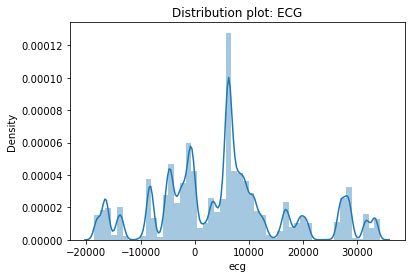

In [ ]:
# distribution plot
sns.distplot(train_df['ecg'])
plt.title("Distribution plot: ECG")
plt.show()

#### Observation:
1. The range is -18585 to 34188.
2. The density is heighest at around 6000.

Let us check box plot and violin plot.

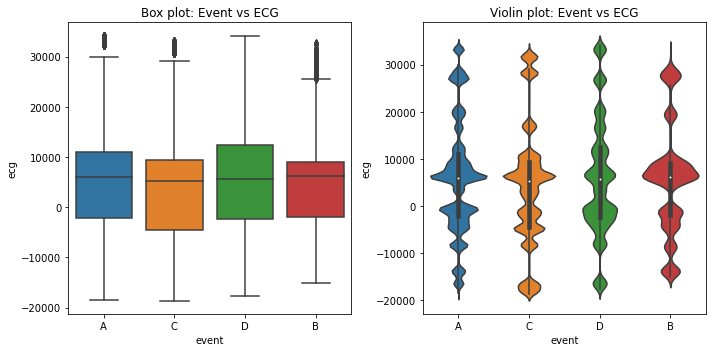

In [ ]:
fig = plt.figure(figsize=(10,5))
# box plot
plt.subplot(1, 2, 1)
sns.boxplot(x = 'event', y = 'ecg', data = train_df)
plt.gca().set_title('Box plot: Event vs ECG')

# violin plot
plt.subplot(1, 2, 2)
sns.violinplot(x='event', y='ecg', data=train_df)
plt.gca().set_title("Violin plot: Event vs ECG")
fig.tight_layout()
plt.show()

#### Observations:
1. The box plot for all the events are similar.
2. Events A, C and B have outliers.

Let us check violin plot.

### 2.9 Analysis of 'r' feature

In [ ]:
# summary of ecg feature
train_df['r'].describe()

count    4.867421e+06
mean     7.376090e+02
std      8.187979e+01
min      4.820600e+02
25%      6.631430e+02
50%      7.434380e+02
75%      8.134120e+02
max      8.401840e+02
Name: r, dtype: float64

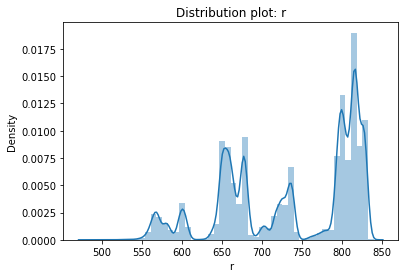

In [ ]:
# distribution plot
sns.distplot(train_df['r'])
plt.title("Distribution plot: r")
plt.show()

#### Observation:
1. The range is 482 to 840.
2. The density is heighest at around 820.

Let us check box plot and violin plot.

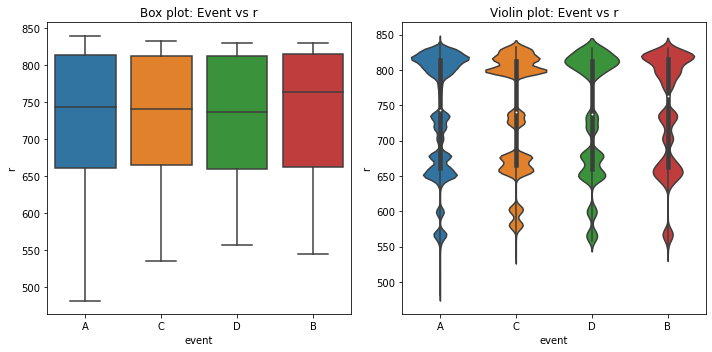

In [ ]:
fig = plt.figure(figsize=(10,5))
# box plot
plt.subplot(1, 2, 1)
sns.boxplot(x = 'event', y = 'r', data = train_df)
plt.gca().set_title('Box plot: Event vs r')

# violin plot
plt.subplot(1, 2, 2)
sns.violinplot(x='event', y='r', data=train_df)
plt.gca().set_title("Violin plot: Event vs r")
fig.tight_layout()
plt.show()

#### Observations:
1. The IQR in box plot for events A, C and D are similar.
2. The range of event A is higher when compared to others.

### 2.10 Analysis of 'gsr' feature

In [ ]:
# summary of ecg feature
train_df['gsr'].describe()

count    4.867421e+06
mean     8.518467e+02
std      5.039324e+02
min      0.000000e+00
25%      5.241140e+02
50%      7.701970e+02
75%      1.197120e+03
max      1.999860e+03
Name: gsr, dtype: float64

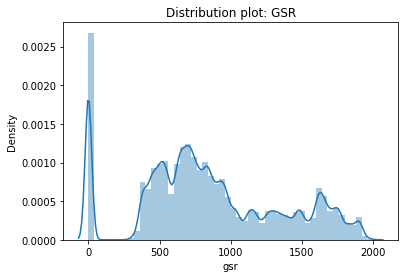

In [ ]:
# distribution plot
sns.distplot(train_df['gsr'])
plt.title("Distribution plot: GSR")
plt.show()

#### Observation:
1. The range is 0 to 1999.
2. The density is heighest at 0.
3. There are no values between 50 to 300

Let us check box plot and violin plot.

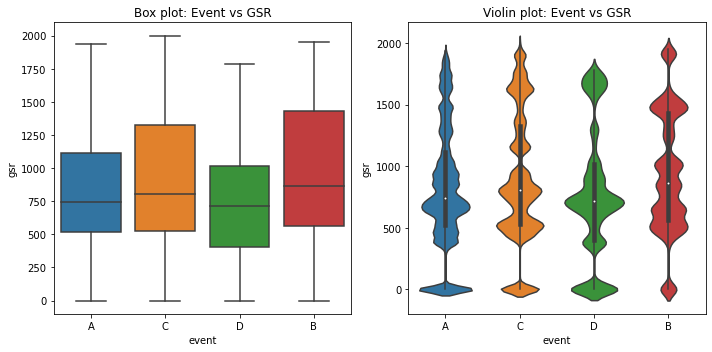

In [ ]:
fig = plt.figure(figsize=(10,5))
# box plot
plt.subplot(1, 2, 1)
sns.boxplot(x = 'event', y = 'gsr', data = train_df)
plt.gca().set_title('Box plot: Event vs GSR')

# violin plot
plt.subplot(1, 2, 2)
sns.violinplot(x='event', y='gsr', data=train_df)
plt.gca().set_title("Violin plot: Event vs GSR")
fig.tight_layout()
plt.show()

#### Observations:
1. The IQR of all the events are different.
2. Event C and B have a higher range. 
3. Event D has lower output values. 
4. From violin plot we can infer that if the value from gsr is too high the pilot is more likely to be in SS state.

### 2.11 Analysis of EEG features

In [ ]:
eeg_features = ["eeg_fp1", "eeg_f7", "eeg_f8", "eeg_t4", "eeg_t6", 
                "eeg_t5", "eeg_t3", "eeg_fp2", "eeg_o1", "eeg_p3", 
                "eeg_pz", "eeg_f3", "eeg_fz", "eeg_f4", "eeg_c4", 
                "eeg_p4", "eeg_poz", "eeg_c3", "eeg_cz", "eeg_o2"]

In [ ]:
print("-"*50)
for eeg in eeg_features:
    print(f"Description of {eeg}:")
    print(train_df[eeg].describe())
    print("-"*50)

--------------------------------------------------
Description of eeg_fp1:
count    4.867421e+06
mean     3.746336e+00
std      4.506763e+01
min     -1.361360e+03
25%     -9.200250e+00
50%      3.819020e-01
75%      1.030610e+01
max      1.972240e+03
Name: eeg_fp1, dtype: float64
--------------------------------------------------
Description of eeg_f7:
count    4.867421e+06
mean     1.360002e+00
std      3.518923e+01
min     -1.581330e+03
25%     -8.325150e+00
50%      4.264100e-02
75%      8.753340e+00
max      2.048790e+03
Name: eeg_f7, dtype: float64
--------------------------------------------------
Description of eeg_f8:
count    4.867421e+06
mean     1.213644e+00
std      3.519242e+01
min     -1.643950e+03
25%     -8.767610e+00
50%      1.140390e-01
75%      9.282560e+00
max      2.145710e+03
Name: eeg_f8, dtype: float64
--------------------------------------------------
Description of eeg_t4:
count    4.867421e+06
mean     7.350926e-02
std      2.431472e+01
min     -1.516640e+03

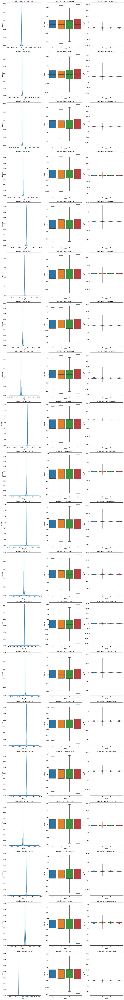

In [ ]:
fig = plt.figure(figsize=(15,120))
i=0
for eeg in eeg_features:
    # dist plot
    i += 1
    plt.subplot(20, 3, i)
    sns.distplot(train_df[eeg])
    plt.gca().set_title(f"Distribution plot: {eeg}")
    
    # box plot
    i += 1
    plt.subplot(20, 3, i)
    sns.boxplot(x = 'event', y = eeg, data = train_df, showfliers=False)
    plt.gca().set_title(f"Box plot: Event vs {eeg}")

    # violin plot
    i += 1
    plt.subplot(20, 3, i)
    sns.violinplot(x='event', y=eeg, data=train_df, scale='width')
    plt.gca().set_title(f"Violin plot: Event vs {eeg}")
    
fig.tight_layout()
plt.show()

#### Observations:
1. The plots of all the features are comparable.
2. From the distribution plot and violin, we can infer that all the eeg features are almost normally distributed with most of the values close to 0.
3. From box plot we can infer that most of the features are highly overlapping.
4. For event 'A' the range of values is significantly higher when compared to other events.

### 2.12 Correlations between features

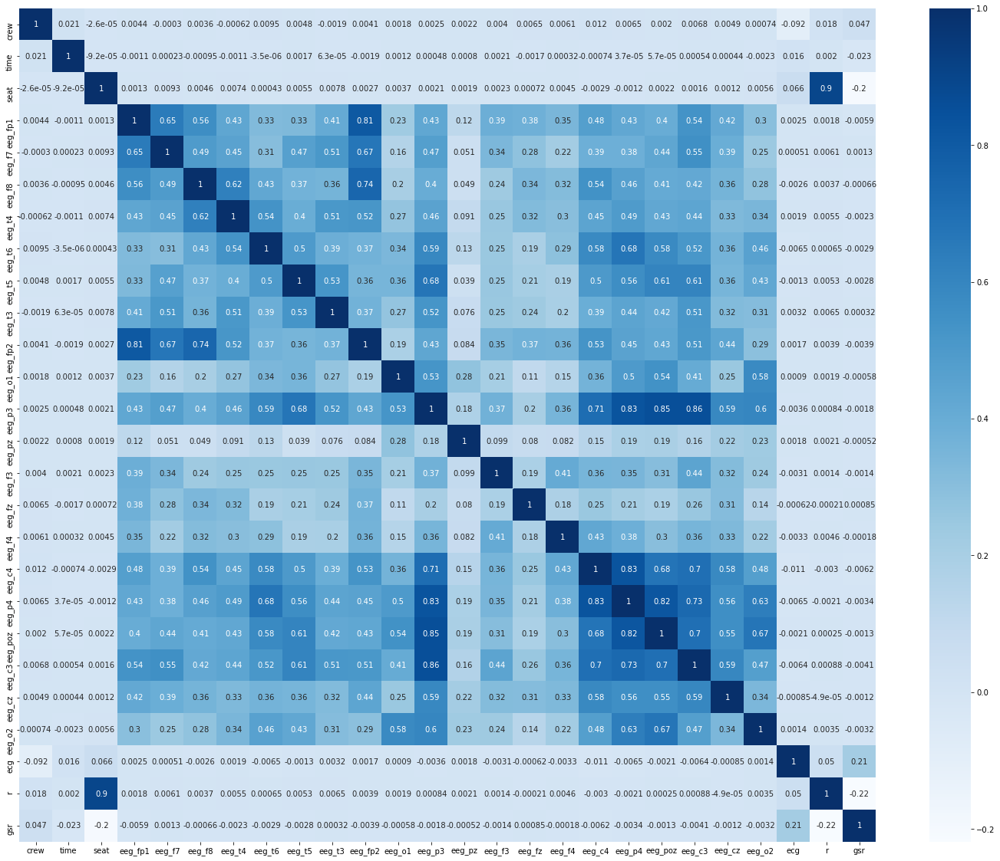

In [ ]:
plt.figure(figsize=(25,20))
# compute correlations
corr_matrix=train_df.corr()

#plot heatmap for visualization
sns.heatmap(corr_matrix, annot=True, cmap="Blues")
plt.show()

#### Observations:
1. GSR, Respiration and ECG correlated. This is logical because if one of it increases then the probablity of increment of other two features is also high when the pilot is in a cognitive case.
2. Some of the EEG features are also correlated.

### 2.13 Verify if train and test data have same distribution

We need to confirm if the train and test data are similar. We will build a simple logistic regression model to test this.
If our model can not classify the train and test data then it implies that our train and test data are similar.

In [ ]:
# build the data for logistic regression model
train_df['output_label'] = np.zeros(train_df.shape[0])
test_df['output_label'] = np.ones(test_df.shape[0])
train_df = train_df.append(test_df, ignore_index=True)

# create labels set
y = train_df['output_label']
train_df = train_df.drop(['output_label', 'experiment', 'event', 'id'], axis=1)

In [ ]:
# train test split
X_train, X_test, y_train, y_test = train_test_split(train_df, y, test_size=0.25, random_state=10, stratify=y)

In [ ]:
# build and train the model
model = LogisticRegression(random_state=10, n_jobs=-1)
clf = model.fit(X_train, y_train)

# predict output using test data
y_pred = clf.predict(X_test)

In [ ]:
# compute log loss 
log_loss(y_test, y_pred)

2.992365335496293

The log loss is high which means that train and test data are similar.
## 3. Exploratory Data Analysis - Multivariate Analysis
### 3.1 t-SNE

In [ ]:
# load the train to dataframe
train_df = pd.read_csv("/home/admin1/Data/Nikhil/kaggle/data/train.csv")

In [ ]:
# sample 1 million points for visualization
train_df_sampled = train_df.sample(100000)

# create labels list
target = list(train_df_sampled['event'])
train_df_sampled = train_df_sampled.drop(['experiment', 'event'], axis=1)

In [ ]:
# perform standard scaling on sampled data
scaler = StandardScaler()
train_df_scaled = scaler.fit_transform(train_df_sampled)

We have sampled 1 lakh data points and standardized them. Let us perform t-SNE on it with different perplexity values.

#### 3.1.1 t-SNE with perplexity 30

In [ ]:
tsne = TSNE(n_components=2, verbose=1, perplexity=30, n_jobs=-1)
projections = tsne.fit_transform(train_df_scaled)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 100000 samples in 0.006s...
[t-SNE] Computed neighbors for 100000 samples in 4.252s...
[t-SNE] Computed conditional probabilities for sample 1000 / 100000
[t-SNE] Computed conditional probabilities for sample 2000 / 100000
[t-SNE] Computed conditional probabilities for sample 3000 / 100000
[t-SNE] Computed conditional probabilities for sample 4000 / 100000
[t-SNE] Computed conditional probabilities for sample 5000 / 100000
[t-SNE] Computed conditional probabilities for sample 6000 / 100000
[t-SNE] Computed conditional probabilities for sample 7000 / 100000
[t-SNE] Computed conditional probabilities for sample 8000 / 100000
[t-SNE] Computed conditional probabilities for sample 9000 / 100000
[t-SNE] Computed conditional probabilities for sample 10000 / 100000
[t-SNE] Computed conditional probabilities for sample 11000 / 100000
[t-SNE] Computed conditional probabilities for sample 12000 / 100000
[t-SNE] Computed conditional probabi

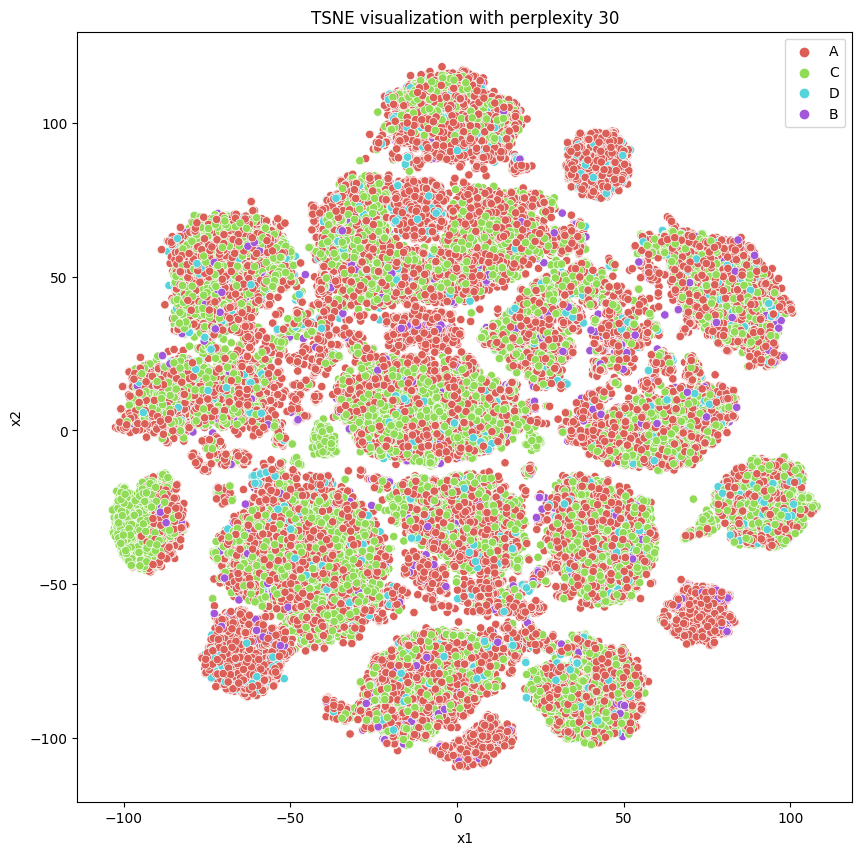

In [ ]:
tsne_df = pd.DataFrame()
tsne_df['x1'] = projections[:,0]
tsne_df['x2'] = projections[:,1]

# plot 2d scatter plot
plt.figure(figsize=(10,10))
sns.scatterplot(x="x1", y="x2", hue=target,
                palette=sns.color_palette("hls", 4),
                data=tsne_df).set(title="TSNE visualization with perplexity 30")
plt.show()

#### 3.1.2 t-SNE with perplexity 50

In [ ]:
tsne = TSNE(n_components=2, verbose=1, perplexity=50, n_jobs=-1)
projections = tsne.fit_transform(train_df_scaled)

[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 100000 samples in 0.010s...
[t-SNE] Computed neighbors for 100000 samples in 4.624s...
[t-SNE] Computed conditional probabilities for sample 1000 / 100000
[t-SNE] Computed conditional probabilities for sample 2000 / 100000
[t-SNE] Computed conditional probabilities for sample 3000 / 100000
[t-SNE] Computed conditional probabilities for sample 4000 / 100000
[t-SNE] Computed conditional probabilities for sample 5000 / 100000
[t-SNE] Computed conditional probabilities for sample 6000 / 100000
[t-SNE] Computed conditional probabilities for sample 7000 / 100000
[t-SNE] Computed conditional probabilities for sample 8000 / 100000
[t-SNE] Computed conditional probabilities for sample 9000 / 100000
[t-SNE] Computed conditional probabilities for sample 10000 / 100000
[t-SNE] Computed conditional probabilities for sample 11000 / 100000
[t-SNE] Computed conditional probabilities for sample 12000 / 100000
[t-SNE] Computed conditional probab

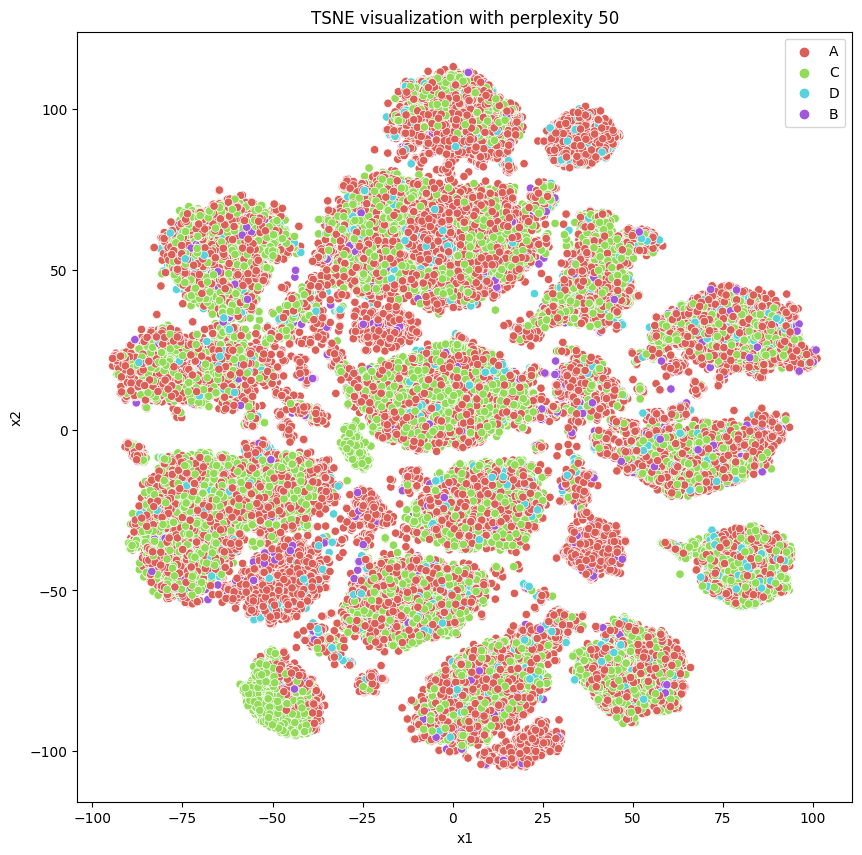

In [ ]:
tsne_df = pd.DataFrame()
tsne_df['x1'] = projections[:,0]
tsne_df['x2'] = projections[:,1]

# plot 2d scatter plot
plt.figure(figsize=(10,10))
sns.scatterplot(x="x1", y="x2", hue=target,
                palette=sns.color_palette("hls", 4),
                data=tsne_df).set(title="TSNE visualization with perplexity 50")
plt.show()

#### 3.1.3 t-SNE with perplexity 100

In [ ]:
tsne = TSNE(n_components=2, verbose=1, perplexity=100, n_jobs=-1)
projections = tsne.fit_transform(train_df_scaled)

[t-SNE] Computing 301 nearest neighbors...
[t-SNE] Indexed 100000 samples in 0.013s...
[t-SNE] Computed neighbors for 100000 samples in 5.607s...
[t-SNE] Computed conditional probabilities for sample 1000 / 100000
[t-SNE] Computed conditional probabilities for sample 2000 / 100000
[t-SNE] Computed conditional probabilities for sample 3000 / 100000
[t-SNE] Computed conditional probabilities for sample 4000 / 100000
[t-SNE] Computed conditional probabilities for sample 5000 / 100000
[t-SNE] Computed conditional probabilities for sample 6000 / 100000
[t-SNE] Computed conditional probabilities for sample 7000 / 100000
[t-SNE] Computed conditional probabilities for sample 8000 / 100000
[t-SNE] Computed conditional probabilities for sample 9000 / 100000
[t-SNE] Computed conditional probabilities for sample 10000 / 100000
[t-SNE] Computed conditional probabilities for sample 11000 / 100000
[t-SNE] Computed conditional probabilities for sample 12000 / 100000
[t-SNE] Computed conditional probab

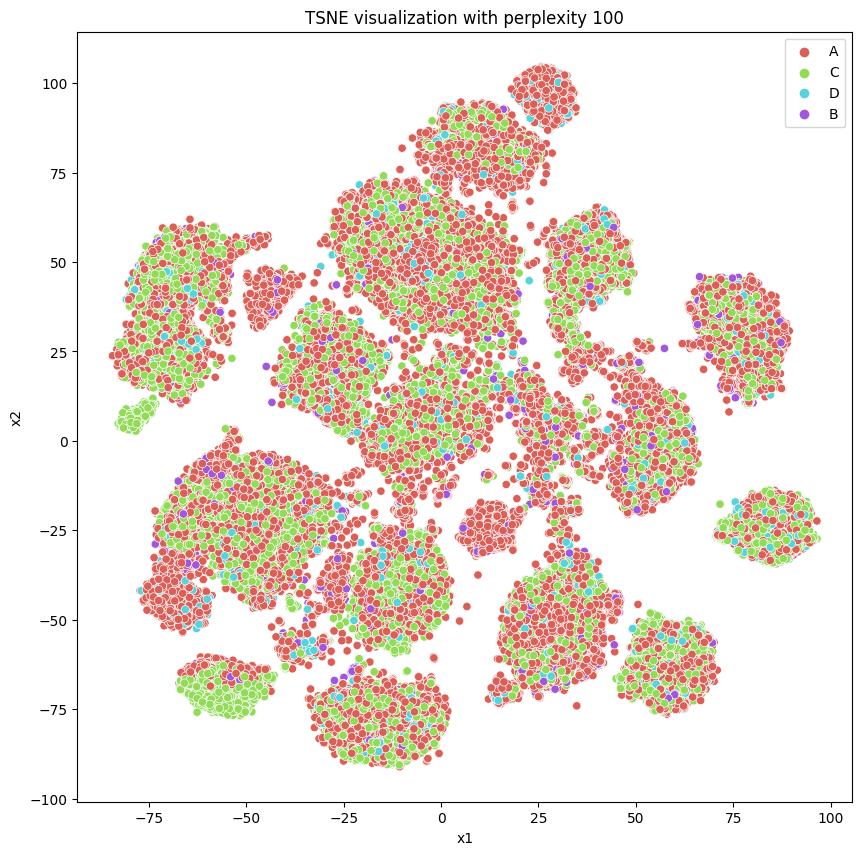

In [ ]:
tsne_df = pd.DataFrame()
tsne_df['x1'] = projections[:,0]
tsne_df['x2'] = projections[:,1]

# plot 2d scatter plot
plt.figure(figsize=(10,10))
sns.scatterplot(x="x1", y="x2", hue=target,
                palette=sns.color_palette("hls", 4),
                data=tsne_df).set(title="TSNE visualization with perplexity 100")
plt.show()

#### 3.1.4 t-SNE with perplexity 200

In [ ]:
tsne = TSNE(n_components=2, verbose=1, perplexity=200, n_jobs=-1)
projections = tsne.fit_transform(train_df_scaled)

[t-SNE] Computing 601 nearest neighbors...
[t-SNE] Indexed 100000 samples in 0.007s...
[t-SNE] Computed neighbors for 100000 samples in 7.588s...
[t-SNE] Computed conditional probabilities for sample 1000 / 100000
[t-SNE] Computed conditional probabilities for sample 2000 / 100000
[t-SNE] Computed conditional probabilities for sample 3000 / 100000
[t-SNE] Computed conditional probabilities for sample 4000 / 100000
[t-SNE] Computed conditional probabilities for sample 5000 / 100000
[t-SNE] Computed conditional probabilities for sample 6000 / 100000
[t-SNE] Computed conditional probabilities for sample 7000 / 100000
[t-SNE] Computed conditional probabilities for sample 8000 / 100000
[t-SNE] Computed conditional probabilities for sample 9000 / 100000
[t-SNE] Computed conditional probabilities for sample 10000 / 100000
[t-SNE] Computed conditional probabilities for sample 11000 / 100000
[t-SNE] Computed conditional probabilities for sample 12000 / 100000
[t-SNE] Computed conditional probab

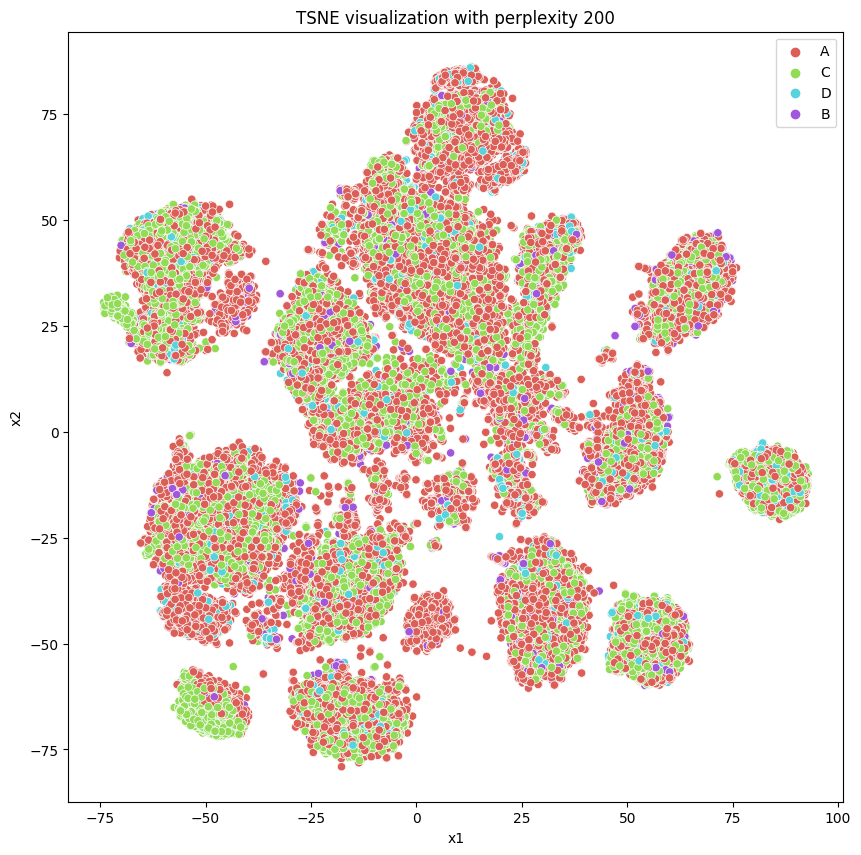

In [ ]:
tsne_df = pd.DataFrame()
tsne_df['x1'] = projections[:,0]
tsne_df['x2'] = projections[:,1]

# plot 2d scatter plot
plt.figure(figsize=(10,10))
sns.scatterplot(x="x1", y="x2", hue=target,
                palette=sns.color_palette("hls", 4),
                data=tsne_df).set(title="TSNE visualization with perplexity 200")
plt.show()

#### 3.1.5 t-SNE with perplexity 300

In [ ]:
tsne = TSNE(n_components=2, verbose=1, perplexity=300, n_jobs=-1)
projections = tsne.fit_transform(train_df_scaled)

[t-SNE] Computing 901 nearest neighbors...
[t-SNE] Indexed 100000 samples in 0.007s...
[t-SNE] Computed neighbors for 100000 samples in 9.393s...
[t-SNE] Computed conditional probabilities for sample 1000 / 100000
[t-SNE] Computed conditional probabilities for sample 2000 / 100000
[t-SNE] Computed conditional probabilities for sample 3000 / 100000
[t-SNE] Computed conditional probabilities for sample 4000 / 100000
[t-SNE] Computed conditional probabilities for sample 5000 / 100000
[t-SNE] Computed conditional probabilities for sample 6000 / 100000
[t-SNE] Computed conditional probabilities for sample 7000 / 100000
[t-SNE] Computed conditional probabilities for sample 8000 / 100000
[t-SNE] Computed conditional probabilities for sample 9000 / 100000
[t-SNE] Computed conditional probabilities for sample 10000 / 100000
[t-SNE] Computed conditional probabilities for sample 11000 / 100000
[t-SNE] Computed conditional probabilities for sample 12000 / 100000
[t-SNE] Computed conditional probab

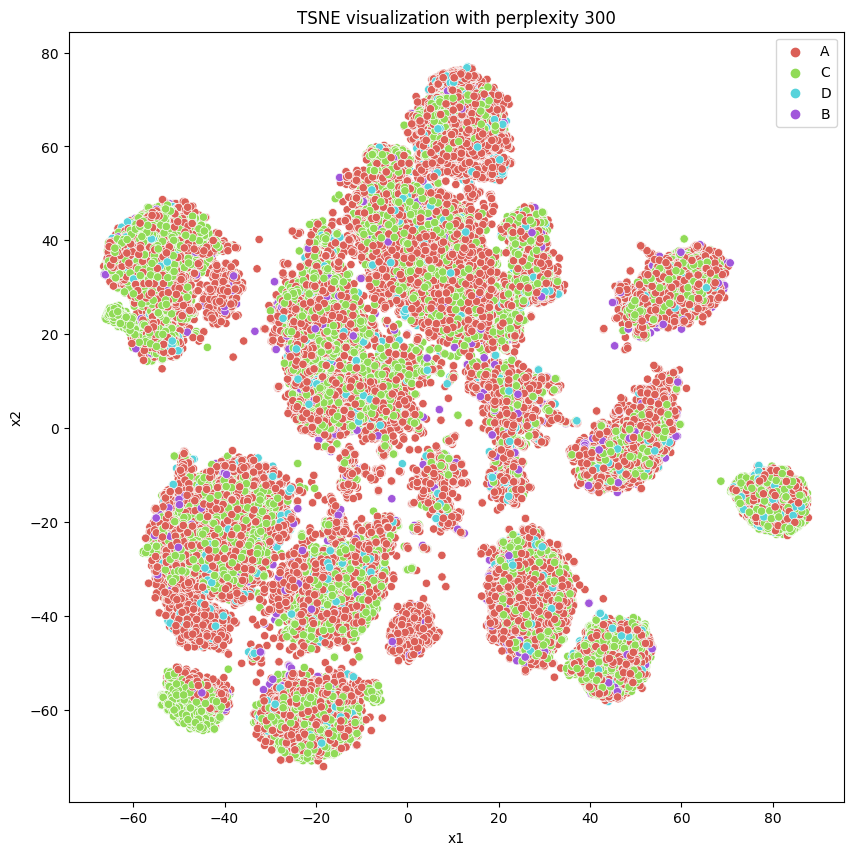

In [ ]:
tsne_df = pd.DataFrame()
tsne_df['x1'] = projections[:,0]
tsne_df['x2'] = projections[:,1]

# plot 2d scatter plot
plt.figure(figsize=(10,10))
sns.scatterplot(x="x1", y="x2", hue=target,
                palette=sns.color_palette("hls", 4),
                data=tsne_df).set(title="TSNE visualization with perplexity 300")
plt.show()

#### 3.1.6 t-SNE with perplexity 400

In [ ]:
tsne = TSNE(n_components=2, verbose=1, perplexity=400, n_jobs=-1)
projections = tsne.fit_transform(train_df_scaled)

[t-SNE] Computing 1201 nearest neighbors...
[t-SNE] Indexed 100000 samples in 0.007s...
[t-SNE] Computed neighbors for 100000 samples in 12.125s...
[t-SNE] Computed conditional probabilities for sample 1000 / 100000
[t-SNE] Computed conditional probabilities for sample 2000 / 100000
[t-SNE] Computed conditional probabilities for sample 3000 / 100000
[t-SNE] Computed conditional probabilities for sample 4000 / 100000
[t-SNE] Computed conditional probabilities for sample 5000 / 100000
[t-SNE] Computed conditional probabilities for sample 6000 / 100000
[t-SNE] Computed conditional probabilities for sample 7000 / 100000
[t-SNE] Computed conditional probabilities for sample 8000 / 100000
[t-SNE] Computed conditional probabilities for sample 9000 / 100000
[t-SNE] Computed conditional probabilities for sample 10000 / 100000
[t-SNE] Computed conditional probabilities for sample 11000 / 100000
[t-SNE] Computed conditional probabilities for sample 12000 / 100000
[t-SNE] Computed conditional prob

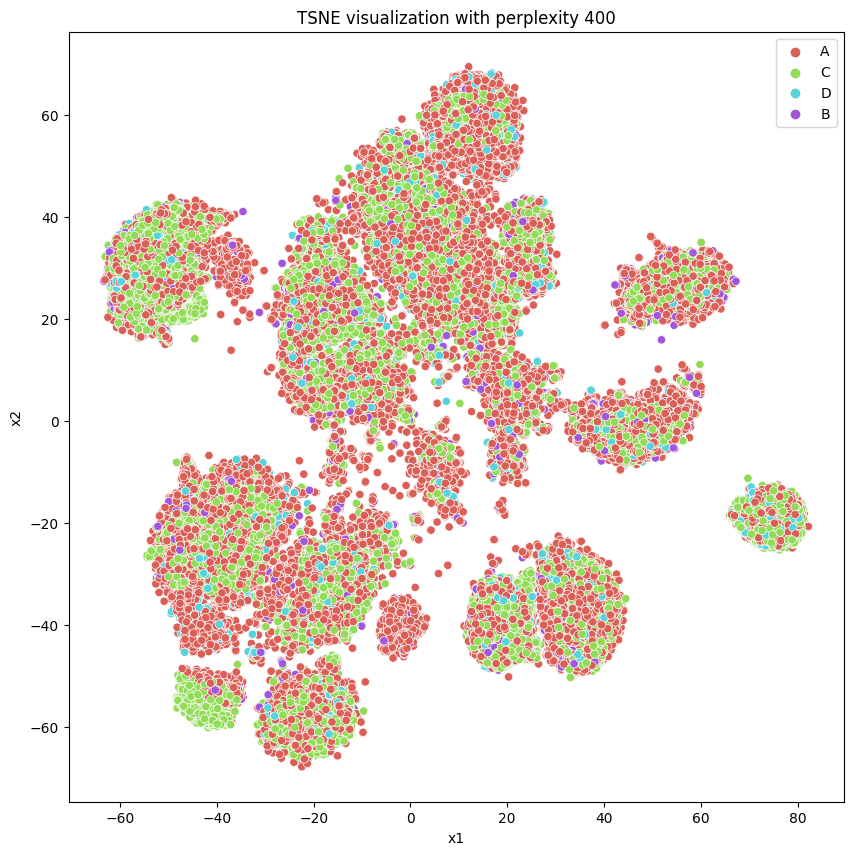

In [ ]:
tsne_df = pd.DataFrame()
tsne_df['x1'] = projections[:,0]
tsne_df['x2'] = projections[:,1]

# plot 2d scatter plot
plt.figure(figsize=(10,10))
sns.scatterplot(x="x1", y="x2", hue=target,
                palette=sns.color_palette("hls", 4),
                data=tsne_df).set(title="TSNE visualization with perplexity 400")
plt.show()

#### 3.1.7 t-SNE with perplexity 500

In [ ]:
tsne = TSNE(n_components=2, verbose=1, perplexity=500, n_jobs=-1)
projections = tsne.fit_transform(train_df_scaled)

[t-SNE] Computing 1501 nearest neighbors...
[t-SNE] Indexed 100000 samples in 0.007s...
[t-SNE] Computed neighbors for 100000 samples in 12.888s...
[t-SNE] Computed conditional probabilities for sample 1000 / 100000
[t-SNE] Computed conditional probabilities for sample 2000 / 100000
[t-SNE] Computed conditional probabilities for sample 3000 / 100000
[t-SNE] Computed conditional probabilities for sample 4000 / 100000
[t-SNE] Computed conditional probabilities for sample 5000 / 100000
[t-SNE] Computed conditional probabilities for sample 6000 / 100000
[t-SNE] Computed conditional probabilities for sample 7000 / 100000
[t-SNE] Computed conditional probabilities for sample 8000 / 100000
[t-SNE] Computed conditional probabilities for sample 9000 / 100000
[t-SNE] Computed conditional probabilities for sample 10000 / 100000
[t-SNE] Computed conditional probabilities for sample 11000 / 100000
[t-SNE] Computed conditional probabilities for sample 12000 / 100000
[t-SNE] Computed conditional prob

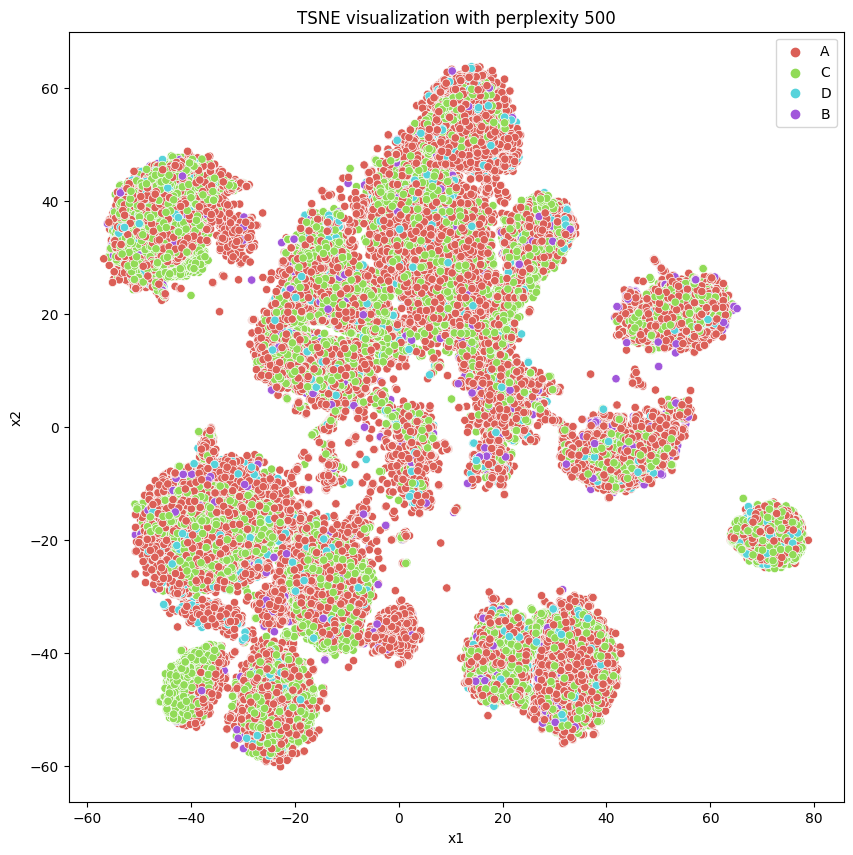

In [ ]:
tsne_df = pd.DataFrame()
tsne_df['x1'] = projections[:,0]
tsne_df['x2'] = projections[:,1]

# plot 2d scatter plot
plt.figure(figsize=(10,10))
sns.scatterplot(x="x1", y="x2", hue=target,
                palette=sns.color_palette("hls", 4),
                data=tsne_df).set(title="TSNE visualization with perplexity 500")
plt.show()

#### Observations:
Not much change in ouput after perplexity 300.

Let us try to perform t-SNE with different number of iteration with perplexity values as 300.

#### 3.1.8 t-SNE with perplexity 300 and 1500 iterations.

In [ ]:
tsne = TSNE(n_components=2, verbose=1, perplexity=300, n_iter=1500, n_jobs=-1)
projections = tsne.fit_transform(train_df_scaled)

[t-SNE] Computing 901 nearest neighbors...
[t-SNE] Indexed 100000 samples in 0.008s...
[t-SNE] Computed neighbors for 100000 samples in 10.697s...
[t-SNE] Computed conditional probabilities for sample 1000 / 100000
[t-SNE] Computed conditional probabilities for sample 2000 / 100000
[t-SNE] Computed conditional probabilities for sample 3000 / 100000
[t-SNE] Computed conditional probabilities for sample 4000 / 100000
[t-SNE] Computed conditional probabilities for sample 5000 / 100000
[t-SNE] Computed conditional probabilities for sample 6000 / 100000
[t-SNE] Computed conditional probabilities for sample 7000 / 100000
[t-SNE] Computed conditional probabilities for sample 8000 / 100000
[t-SNE] Computed conditional probabilities for sample 9000 / 100000
[t-SNE] Computed conditional probabilities for sample 10000 / 100000
[t-SNE] Computed conditional probabilities for sample 11000 / 100000
[t-SNE] Computed conditional probabilities for sample 12000 / 100000
[t-SNE] Computed conditional proba

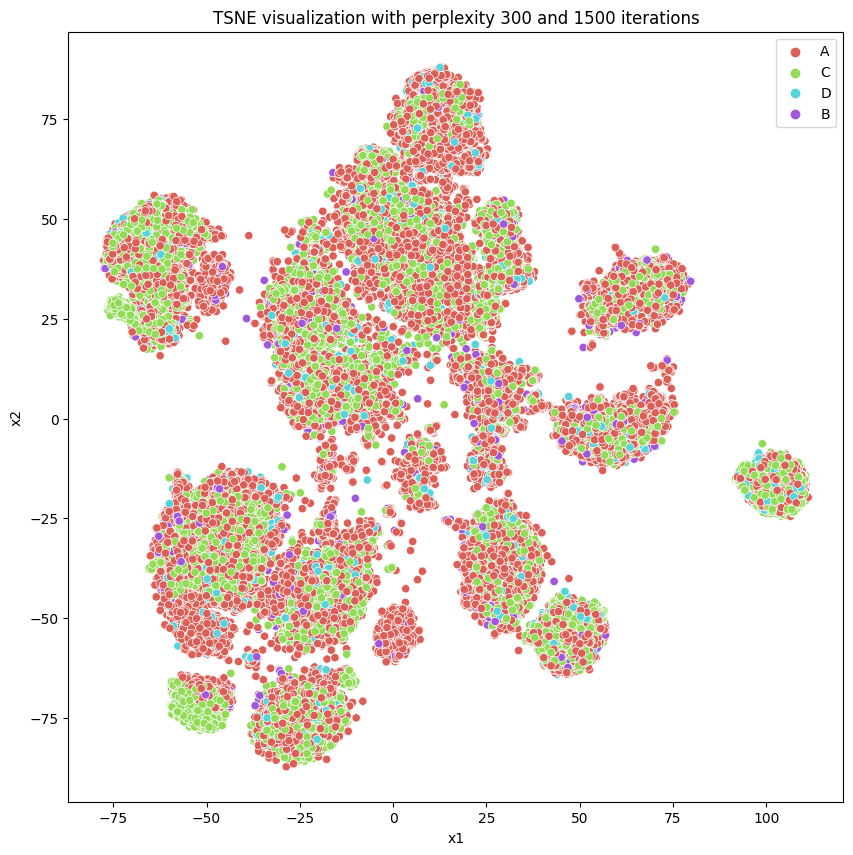

In [ ]:
tsne_df = pd.DataFrame()
tsne_df['x1'] = projections[:,0]
tsne_df['x2'] = projections[:,1]

# plot 2d scatter plot
plt.figure(figsize=(10,10))
sns.scatterplot(x="x1", y="x2", hue=target,
                palette=sns.color_palette("hls", 4),
                data=tsne_df).set(title="TSNE visualization with perplexity 300 and 1500 iterations")
plt.show()

#### 3.1.9 t-SNE with perplexity 300 and 2000 iterations.

In [ ]:
tsne = TSNE(n_components=2, verbose=1, perplexity=300, n_iter=2000, n_jobs=-1)
projections = tsne.fit_transform(train_df_scaled)

[t-SNE] Computing 901 nearest neighbors...
[t-SNE] Indexed 100000 samples in 0.007s...
[t-SNE] Computed neighbors for 100000 samples in 8.878s...
[t-SNE] Computed conditional probabilities for sample 1000 / 100000
[t-SNE] Computed conditional probabilities for sample 2000 / 100000
[t-SNE] Computed conditional probabilities for sample 3000 / 100000
[t-SNE] Computed conditional probabilities for sample 4000 / 100000
[t-SNE] Computed conditional probabilities for sample 5000 / 100000
[t-SNE] Computed conditional probabilities for sample 6000 / 100000
[t-SNE] Computed conditional probabilities for sample 7000 / 100000
[t-SNE] Computed conditional probabilities for sample 8000 / 100000
[t-SNE] Computed conditional probabilities for sample 9000 / 100000
[t-SNE] Computed conditional probabilities for sample 10000 / 100000
[t-SNE] Computed conditional probabilities for sample 11000 / 100000
[t-SNE] Computed conditional probabilities for sample 12000 / 100000
[t-SNE] Computed conditional probab

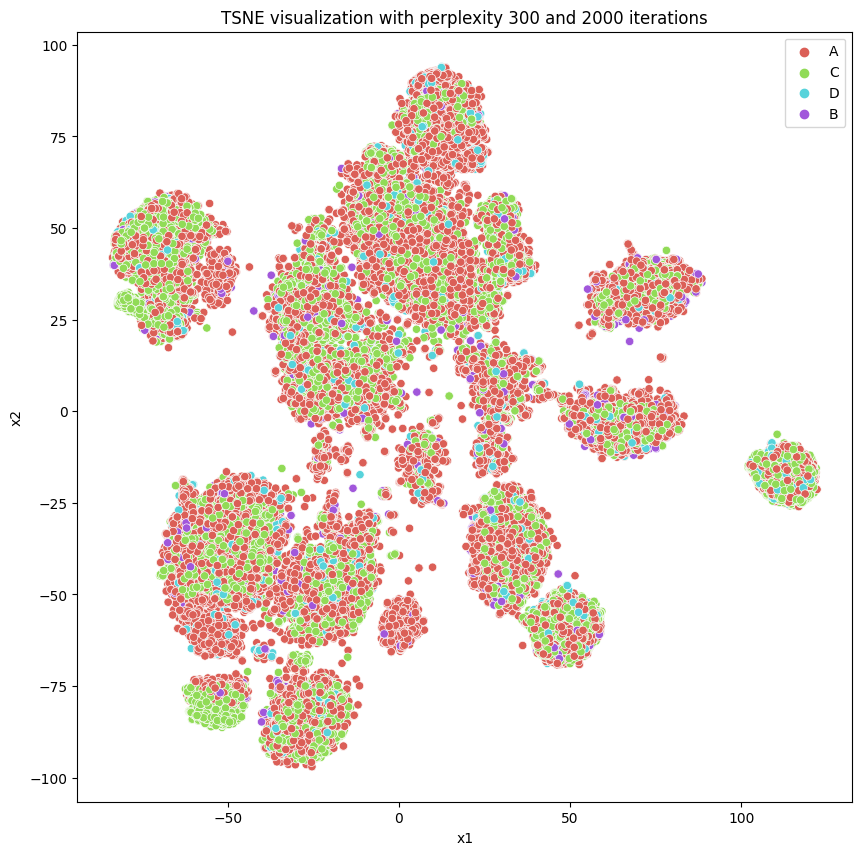

In [ ]:
tsne_df = pd.DataFrame()
tsne_df['x1'] = projections[:,0]
tsne_df['x2'] = projections[:,1]

# plot 2d scatter plot
plt.figure(figsize=(10,10))
sns.scatterplot(x="x1", y="x2", hue=target,
                palette=sns.color_palette("hls", 4),
                data=tsne_df).set(title="TSNE visualization with perplexity 300 and 2000 iterations")
plt.show()

#### 3.1.10 t-SNE with perplexity 300 and 2500 iterations.

In [ ]:
tsne = TSNE(n_components=2, verbose=1, perplexity=300, n_iter=2500, n_jobs=-1)
projections = tsne.fit_transform(train_df_scaled)

[t-SNE] Computing 901 nearest neighbors...
[t-SNE] Indexed 100000 samples in 0.007s...
[t-SNE] Computed neighbors for 100000 samples in 12.323s...
[t-SNE] Computed conditional probabilities for sample 1000 / 100000
[t-SNE] Computed conditional probabilities for sample 2000 / 100000
[t-SNE] Computed conditional probabilities for sample 3000 / 100000
[t-SNE] Computed conditional probabilities for sample 4000 / 100000
[t-SNE] Computed conditional probabilities for sample 5000 / 100000
[t-SNE] Computed conditional probabilities for sample 6000 / 100000
[t-SNE] Computed conditional probabilities for sample 7000 / 100000
[t-SNE] Computed conditional probabilities for sample 8000 / 100000
[t-SNE] Computed conditional probabilities for sample 9000 / 100000
[t-SNE] Computed conditional probabilities for sample 10000 / 100000
[t-SNE] Computed conditional probabilities for sample 11000 / 100000
[t-SNE] Computed conditional probabilities for sample 12000 / 100000
[t-SNE] Computed conditional proba

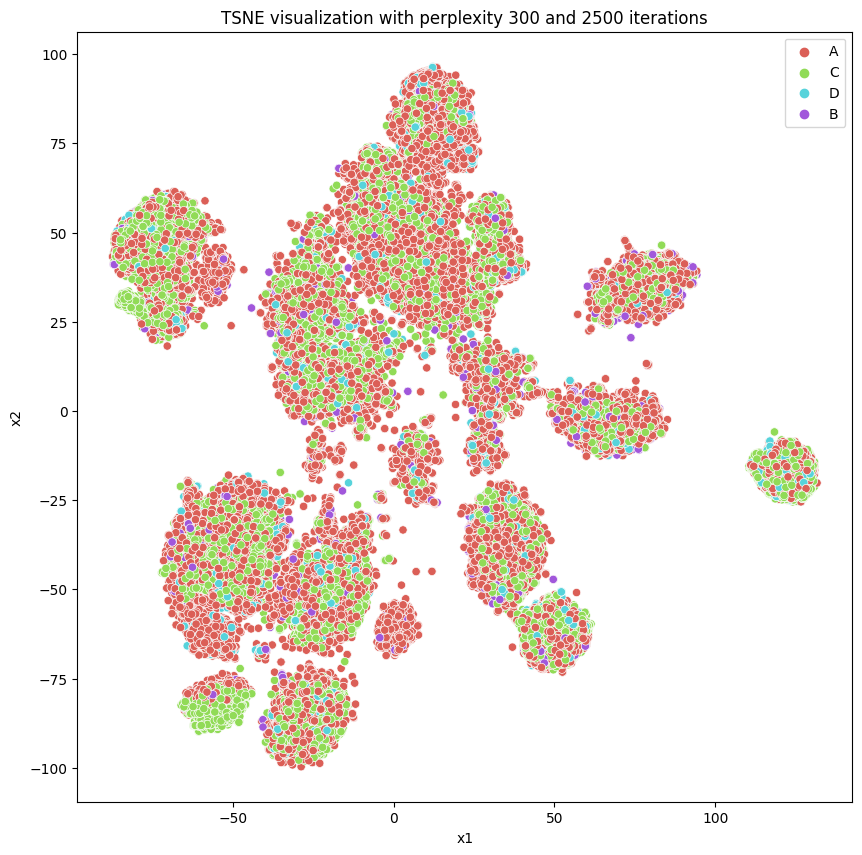

In [ ]:
tsne_df = pd.DataFrame()
tsne_df['x1'] = projections[:,0]
tsne_df['x2'] = projections[:,1]

# plot 2d scatter plot
plt.figure(figsize=(10,10))
sns.scatterplot(x="x1", y="x2", hue=target,
                palette=sns.color_palette("hls", 4),
                data=tsne_df).set(title="TSNE visualization with perplexity 300 and 2500 iterations")
plt.show()

#### 3.1.10 t-SNE with perplexity 300 and 3000 iterations.

In [ ]:
tsne = TSNE(n_components=2, verbose=1, perplexity=300, n_iter=3000, n_jobs=-1)
projections = tsne.fit_transform(train_df_scaled)

[t-SNE] Computing 901 nearest neighbors...
[t-SNE] Indexed 100000 samples in 0.008s...
[t-SNE] Computed neighbors for 100000 samples in 9.395s...
[t-SNE] Computed conditional probabilities for sample 1000 / 100000
[t-SNE] Computed conditional probabilities for sample 2000 / 100000
[t-SNE] Computed conditional probabilities for sample 3000 / 100000
[t-SNE] Computed conditional probabilities for sample 4000 / 100000
[t-SNE] Computed conditional probabilities for sample 5000 / 100000
[t-SNE] Computed conditional probabilities for sample 6000 / 100000
[t-SNE] Computed conditional probabilities for sample 7000 / 100000
[t-SNE] Computed conditional probabilities for sample 8000 / 100000
[t-SNE] Computed conditional probabilities for sample 9000 / 100000
[t-SNE] Computed conditional probabilities for sample 10000 / 100000
[t-SNE] Computed conditional probabilities for sample 11000 / 100000
[t-SNE] Computed conditional probabilities for sample 12000 / 100000
[t-SNE] Computed conditional probab

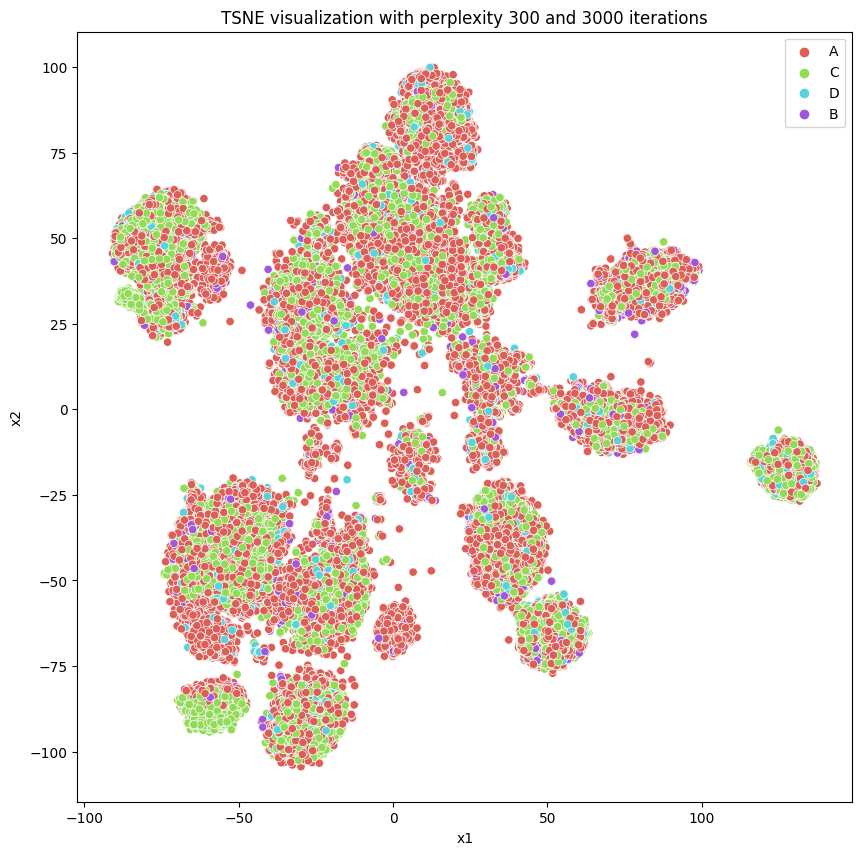

In [ ]:
tsne_df = pd.DataFrame()
tsne_df['x1'] = projections[:,0]
tsne_df['x2'] = projections[:,1]

# plot 2d scatter plot
plt.figure(figsize=(10,10))
sns.scatterplot(x="x1", y="x2", hue=target,
                palette=sns.color_palette("hls", 4),
                data=tsne_df).set(title="TSNE visualization with perplexity 300 and 3000 iterations")
plt.show()

#### Obervations:
1. Not much change in the output as we increase the number of iterations.
2. Most of the points are of event 'A'.
3. There are clusters where we have points 'A' and 'C' combined which can be seperated from events 'B' and 'D'.

### 3.2 PCA

In [ ]:
# create labels list
target = list(train_df['event'])
train_df = train_df.drop(['experiment', 'event'], axis=1)

In [ ]:
# perform min max scaling on the data
scaler = MinMaxScaler()
train_df_rescaled = scaler.fit_transform(train_df)

In [ ]:
train_df_rescaled.shape

(4867421, 26)

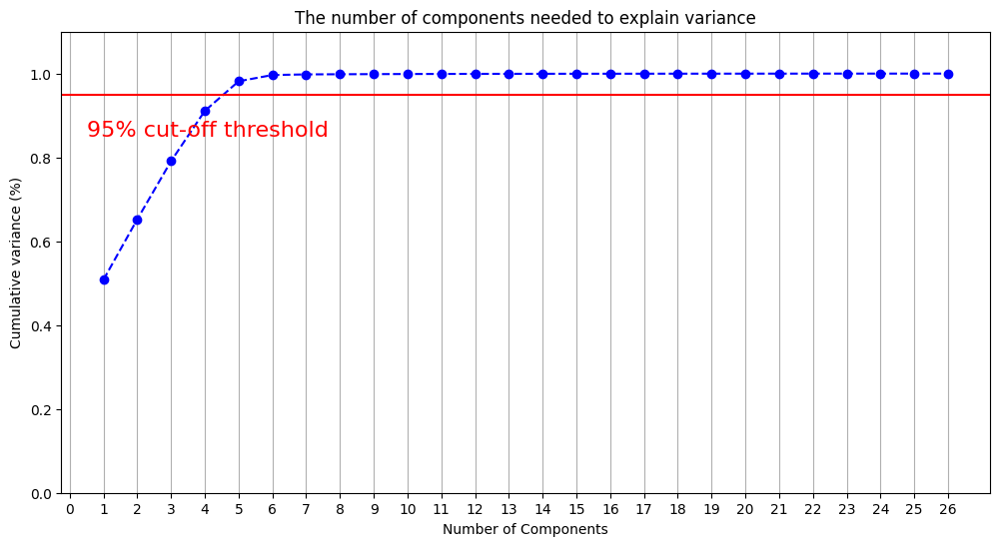

In [ ]:
# choose number of components for PCA
# https://www.mikulskibartosz.name/pca-how-to-choose-the-number-of-components/
pca = PCA(random_state=10).fit(train_df_rescaled)

plt.rcParams["figure.figsize"] = (12,6)

fig, ax = plt.subplots()
xi = np.arange(1, 27, step=1)
y = np.cumsum(pca.explained_variance_ratio_)

plt.ylim(0.0,1.1)
plt.plot(xi, y, marker='o', linestyle='--', color='b')

plt.xlabel('Number of Components')
plt.xticks(np.arange(0, 27, step=1)) #change from 0-based array index to 1-based human-readable label
plt.ylabel('Cumulative variance (%)')
plt.title('The number of components needed to explain variance')

plt.axhline(y=0.95, color='r', linestyle='-') #plot line where cumulative variance is 95%
plt.text(0.5, 0.85, '95% cut-off threshold', color = 'red', fontsize=16)

ax.grid(axis='x')
plt.show()

We can observe that when the number of components is 5, the cumulative variance is above 95%.

In [ ]:
# perform PCA on all features to reduce dimensionality to 5
pca = PCA(n_components=5, random_state=10)
principalComponents = pca.fit_transform(train_df_rescaled)
principalDf = pd.DataFrame(
                data = principalComponents, 
                columns = ['x1', 'x2', 'x3', 'x4', 'x5']
                )

<Figure size 2000x2500 with 0 Axes>

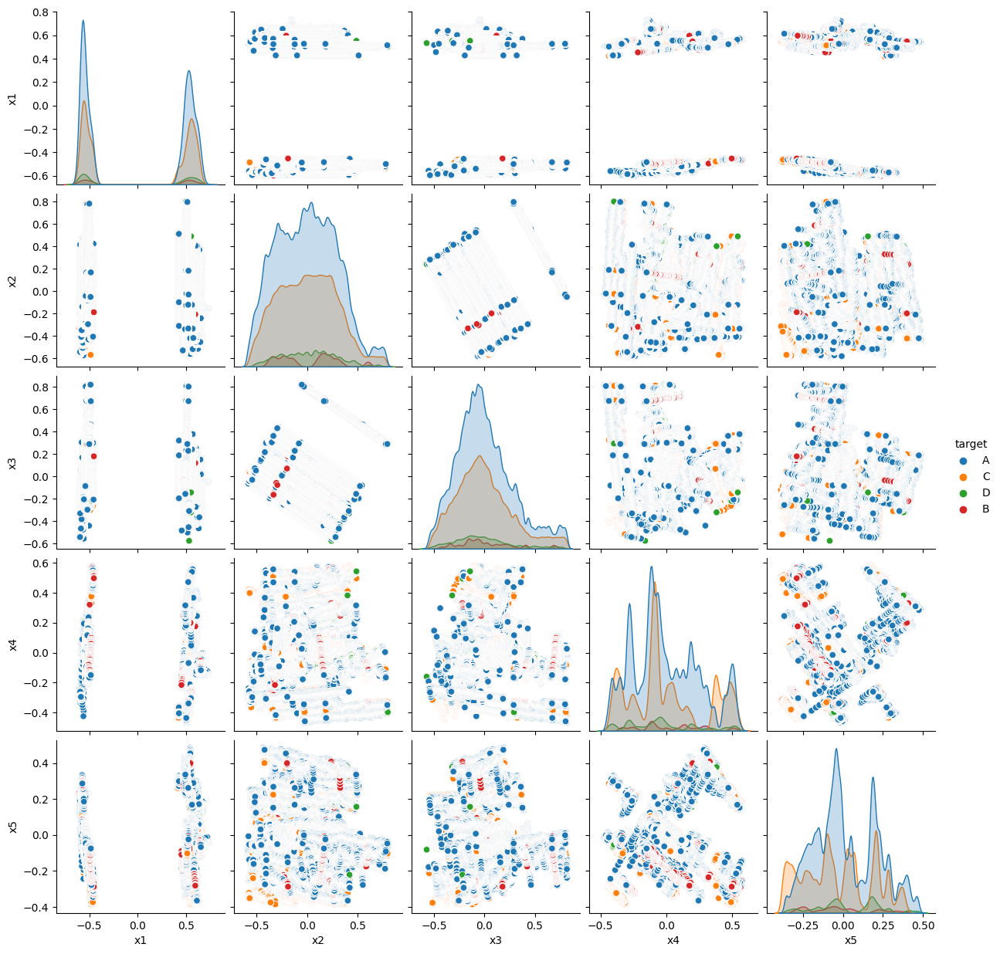

In [ ]:
principalDf['target'] = target

plt.figure(figsize=(20,25))
sns.pairplot(principalDf, hue="target")
plt.show()

The pairplot is difficult to visualize as most of the points are overlapping. Let us sample 1 lakh points randomly and check the results.

In [ ]:
# load the train data to dataframe
train_df = pd.read_csv("/home/admin1/Data/Nikhil/kaggle/data/train.csv")

train_df_sampled = train_df.sample(100000)

# create labels list
target = list(train_df_sampled['event'])
train_df_sampled = train_df_sampled.drop(['experiment', 'event'], axis=1)

In [ ]:
# perform min max scaling on the data
scaler = MinMaxScaler()
train_df_rescaled = scaler.fit_transform(train_df_sampled)

In [ ]:
# perform PCA on all features to reduce dimensionality to 5
pca = PCA(n_components=5, random_state=10)
principalComponents = pca.fit_transform(train_df_rescaled)
principalDf = pd.DataFrame(
                data = principalComponents, 
                columns = ['x1', 'x2', 'x3', 'x4', 'x5']
                )

<Figure size 2000x2500 with 0 Axes>

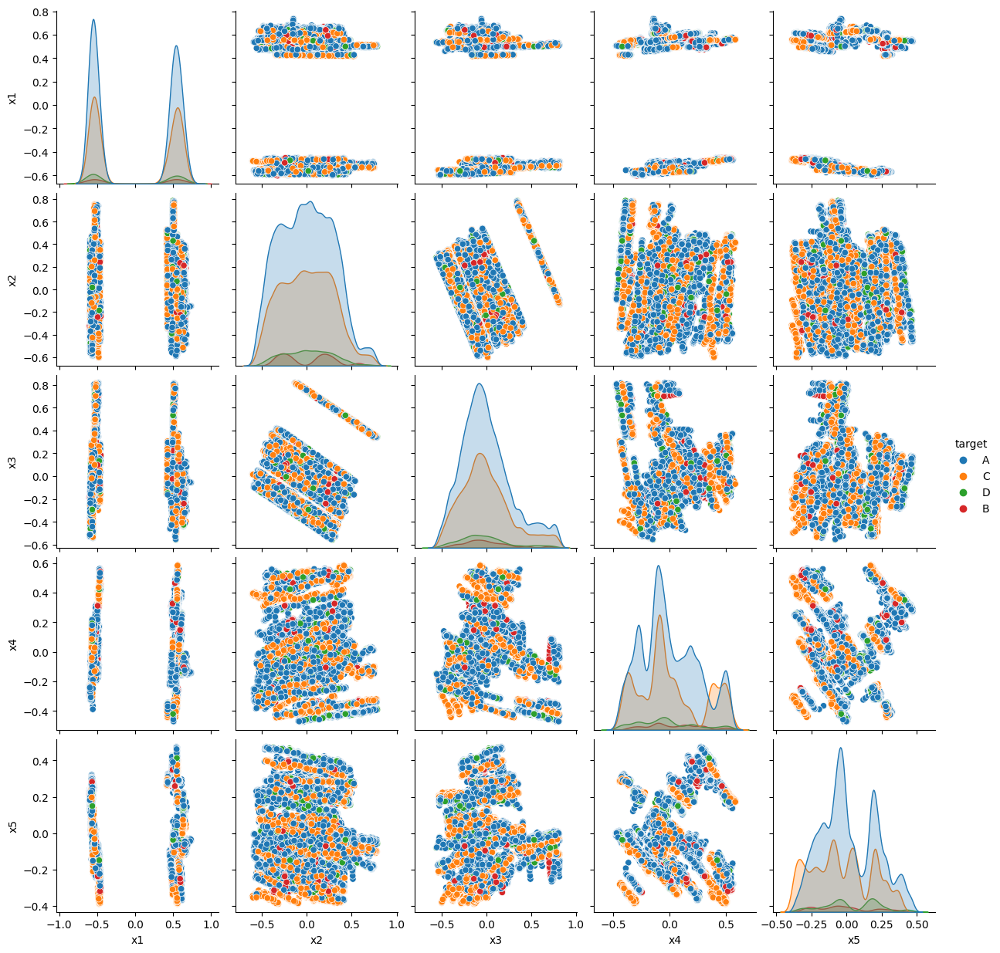

In [ ]:
principalDf['target'] = target

plt.figure(figsize=(20,25))
sns.pairplot(principalDf, hue="target")
plt.show()

#### Observations:
1. For event 'C', value of 'x5' is small when compared to others.
2. For event 'A', values of 'x1' and 'x5' are large when compared to others.
3. Occurence of event 'A' is highest followed by event 'C'. They can be separated to an extent using combination of 'x4' and other features.

## 4. Summary
1. The dataset is imbalanced.
2. There are no duplicate or Nan values in the dataset
3. We have correlation between features ecg, r and gsr.
4. There is an overlap between all the eeg features and they are almost normally distributed.
4. The train and test data are of similar distribution.